In [1]:
# uncomment this if you have cuda and want to specify the device
#import os
#os.environ["CUDA_VISIBLE_DEVICES"]="1"

In [1]:
!git clone https://github.com/tw-yshuang/coco2yolo.git

Cloning into 'coco2yolo'...
remote: Enumerating objects: 82, done.
remote: Counting objects: 100% (82/82), done.
remote: Compressing objects: 100% (53/53), done.
remote: Total 82 (delta 40), reused 66 (delta 28), pack-reused 0
Receiving objects: 100% (82/82), 41.19 KiB | 426.00 KiB/s, done.
Resolving deltas: 100% (40/40), done.


In [2]:
!chmod +x coco2yolo

In [3]:
%cd coco2yolo

/Users/maratgasanov/ml_vk/2semestr/NeuralNetwork/dz7/coco2yolo


In [6]:
!pip install pycocotools

  Using cached pycocotools-2.0.6.tar.gz (24 kB)
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for pycocotools: filename=pycocotools-2.0.6-cp39-cp39-macosx_10_9_x86_64.whl size=86912 sha256=84b74e1a23c2d2e29299af94b68dcbe6a7680a1fb9aa6a988f33d6ef086c7295
  Stored in directory: /Users/maratgasanov/Library/Caches/pip/wheels/29/98/97/6c7dca1f8e4c854e15a2676ac98ae3f46ec83ee031d827a5c8
Successfully built pycocotools


Enter the directory that you save COCO images: ^C

Aborted!


In [2]:
import numpy as np
import cv2
import glob
import matplotlib
%matplotlib inline
import matplotlib.pyplot as plt
import tqdm
import seaborn as sns
import torchvision
import torch
import PIL
from PIL import Image
import json

def show_image(image, figsize=(16, 9), reverse=True):
    plt.figure(figsize=figsize)
    if reverse:
        plt.imshow(image[...,::-1])
    else:
        plt.imshow(image)
    plt.axis('off')
    plt.show()

def save_to_json(filename, data):
    with open(filename, 'w') as f:
        return json.dump(data, f)
    
def load_from_json(filename):
    with open(filename, 'r') as f:
        return json.load(f)

# Load COCO info

Useful links:
http://cocodataset.org/#home

In [3]:
coco_id_to_name = load_from_json("coco_id_to_name.json")

In [4]:
coco_id_to_name = {int(key): value for key, value in coco_id_to_name.items()}

In [5]:
len(coco_id_to_name)

80

In [6]:
list(coco_id_to_name.values())

['person',
 'bicycle',
 'car',
 'motorcycle',
 'airplane',
 'bus',
 'train',
 'truck',
 'boat',
 'traffic light',
 'fire hydrant',
 'stop sign',
 'parking meter',
 'bench',
 'bird',
 'cat',
 'dog',
 'horse',
 'sheep',
 'cow',
 'elephant',
 'bear',
 'zebra',
 'giraffe',
 'backpack',
 'umbrella',
 'handbag',
 'tie',
 'suitcase',
 'frisbee',
 'skis',
 'snowboard',
 'sports ball',
 'kite',
 'baseball bat',
 'baseball glove',
 'skateboard',
 'surfboard',
 'tennis racket',
 'bottle',
 'wine glass',
 'cup',
 'fork',
 'knife',
 'spoon',
 'bowl',
 'banana',
 'apple',
 'sandwich',
 'orange',
 'broccoli',
 'carrot',
 'hot dog',
 'pizza',
 'donut',
 'cake',
 'chair',
 'couch',
 'potted plant',
 'bed',
 'dining table',
 'toilet',
 'tv',
 'laptop',
 'mouse',
 'remote',
 'keyboard',
 'cell phone',
 'microwave',
 'oven',
 'toaster',
 'sink',
 'refrigerator',
 'book',
 'clock',
 'vase',
 'scissors',
 'teddy bear',
 'hair drier',
 'toothbrush']

# Sample run

In [7]:
file = 'detection_examples/mrs_maisel.jpg'

https://github.com/pytorch/vision/blob/c732dfe2a4b1c861d8d1fedd7999f473f8cd3142/torchvision/models/detection/faster_rcnn.py#L24

In [8]:
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True, progress=True,
                            num_classes=91, pretrained_backbone=True)

In [9]:
from torchvision import transforms

to_tensor = transforms.ToTensor()

def val_transform(img):
    img_tensor = to_tensor(img)
    return img_tensor.unsqueeze(0)

def visualize_prediction(file, model, device='cuda', verbose=True, thresh=0.0, n_colors=None):
    img = Image.open(file)
    img_tensor = val_transform(img)
    model.to(device)
    model.eval()
    with torch.no_grad():
        predictions = model(img_tensor.to(device)) # list of size 1
    prediction = predictions[0]
    
    if n_colors is None:
        n_colors = model.roi_heads.box_predictor.cls_score.out_features
    
    palette = sns.color_palette(None, n_colors)
    
    # visualize
    img = cv2.imread(file, cv2.COLOR_BGR2RGB)
    for i in range(len(prediction['boxes'])):
        x1, x2, x3, x4 = map(int, prediction['boxes'][i].tolist())
        label = int(prediction['labels'][i].cpu())
        score = float(prediction['scores'][i].cpu())
        name = coco_id_to_name[label]
        color = palette[label]
        if verbose:
            if score > thresh:
                print ('Class: {}, Confidence: {}'.format(name, score))
        if score > thresh:
            image = cv2.rectangle(img, (x1, x2), (x3, x4), np.array(color) * 255, 2)
            cv2.putText(image, name, (x1, x2-10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, np.array(color) * 255, 2)
    show_image(image)
    return prediction

In [10]:
file

'detection_examples/mrs_maisel.jpg'

In [11]:
img = Image.open(file)

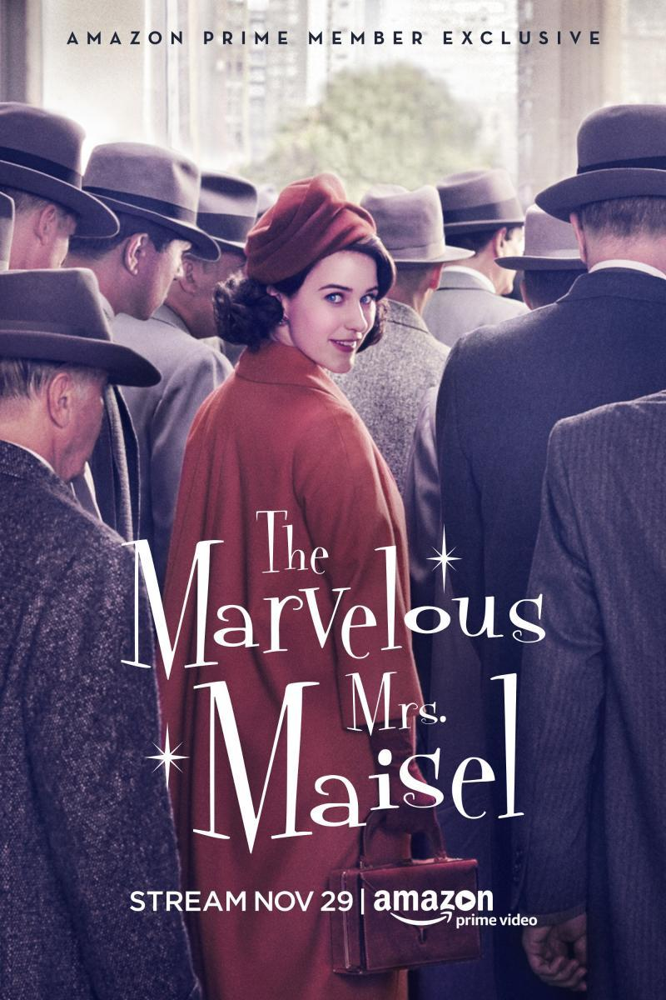

In [12]:
img

/opt/conda/lib/python3.7/site-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  /opt/conda/conda-bld/pytorch_1634272178570/work/aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


Class: person, Confidence: 0.9957576394081116
Class: person, Confidence: 0.9785687327384949
Class: person, Confidence: 0.97111976146698
Class: person, Confidence: 0.9520587921142578
Class: person, Confidence: 0.9485945105552673
Class: person, Confidence: 0.9434379935264587
Class: person, Confidence: 0.9264218211174011
Class: person, Confidence: 0.9073955416679382
Class: person, Confidence: 0.7227162718772888
Class: person, Confidence: 0.6452586650848389
Class: person, Confidence: 0.6441429257392883
Class: tie, Confidence: 0.6039690971374512
Class: chair, Confidence: 0.40416017174720764
Class: person, Confidence: 0.4040907323360443
Class: person, Confidence: 0.4021977186203003
Class: person, Confidence: 0.36066603660583496
Class: person, Confidence: 0.32138240337371826
Class: person, Confidence: 0.31789734959602356
Class: person, Confidence: 0.30351078510284424
Class: person, Confidence: 0.2843640446662903
Class: chair, Confidence: 0.22806596755981445
Class: person, Confidence: 0.219307

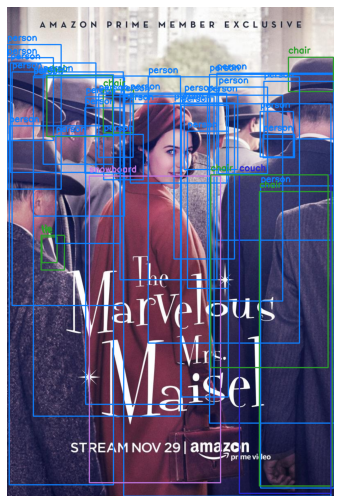

In [13]:
out = visualize_prediction(file, model)

Class: person, Confidence: 0.9957576394081116
Class: person, Confidence: 0.9785687327384949
Class: person, Confidence: 0.97111976146698
Class: person, Confidence: 0.9520587921142578
Class: person, Confidence: 0.9485945105552673
Class: person, Confidence: 0.9434379935264587
Class: person, Confidence: 0.9264218211174011
Class: person, Confidence: 0.9073955416679382


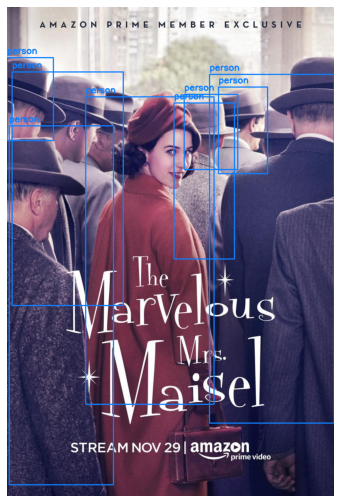

In [14]:
out = visualize_prediction(file, model, thresh=0.8)

# Еще один пример

In [15]:
file = 'detection_examples/junk_food.jpg'

Class: person, Confidence: 0.9768175482749939
Class: person, Confidence: 0.962204098701477
Class: person, Confidence: 0.9575529098510742
Class: person, Confidence: 0.9556108117103577
Class: person, Confidence: 0.8266412019729614
Class: sandwich, Confidence: 0.8228068351745605
Class: hot dog, Confidence: 0.8058313131332397
Class: person, Confidence: 0.500629723072052
Class: sandwich, Confidence: 0.4935189485549927
Class: person, Confidence: 0.48630598187446594
Class: bowl, Confidence: 0.44700953364372253
Class: person, Confidence: 0.44293826818466187
Class: cake, Confidence: 0.2982230484485626
Class: sandwich, Confidence: 0.2690161168575287
Class: cup, Confidence: 0.24258671700954437
Class: person, Confidence: 0.2288263589143753
Class: dining table, Confidence: 0.21245147287845612
Class: cell phone, Confidence: 0.2023983746767044
Class: person, Confidence: 0.17625746130943298
Class: cell phone, Confidence: 0.1737315058708191
Class: sandwich, Confidence: 0.1664554923772812
Class: hot dog

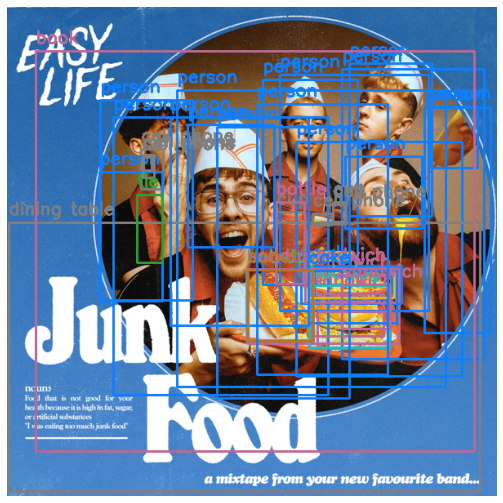

In [16]:
out = visualize_prediction(file, model)

Class: person, Confidence: 0.9768175482749939
Class: person, Confidence: 0.962204098701477
Class: person, Confidence: 0.9575529098510742
Class: person, Confidence: 0.9556108117103577
Class: person, Confidence: 0.8266412019729614
Class: sandwich, Confidence: 0.8228068351745605
Class: hot dog, Confidence: 0.8058313131332397


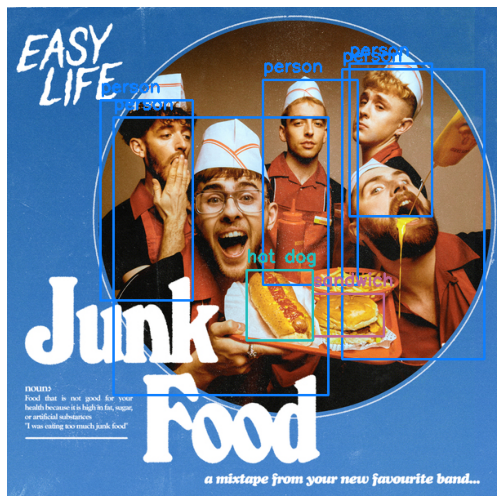

In [17]:
out = visualize_prediction(file, model, thresh=0.8)

Class: person, Confidence: 0.9768175482749939
Class: person, Confidence: 0.962204098701477
Class: person, Confidence: 0.9575529098510742
Class: person, Confidence: 0.9556108117103577
Class: person, Confidence: 0.8266412019729614
Class: sandwich, Confidence: 0.8228068351745605
Class: hot dog, Confidence: 0.8058313131332397
Class: person, Confidence: 0.500629723072052
Class: sandwich, Confidence: 0.4935189485549927
Class: person, Confidence: 0.48630598187446594
Class: bowl, Confidence: 0.44700953364372253
Class: person, Confidence: 0.44293826818466187


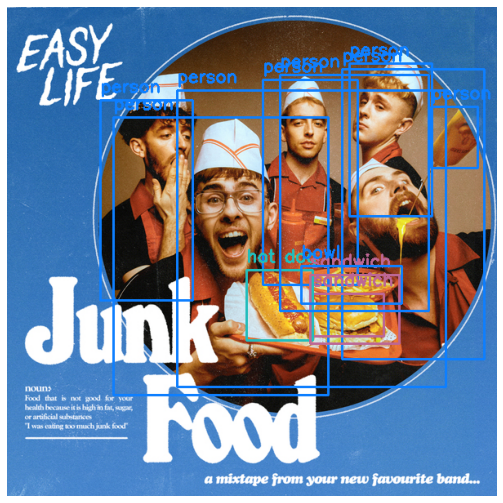

In [18]:
out = visualize_prediction(file, model, thresh=0.4)

In [19]:
list(coco_id_to_name.values())

['person',
 'bicycle',
 'car',
 'motorcycle',
 'airplane',
 'bus',
 'train',
 'truck',
 'boat',
 'traffic light',
 'fire hydrant',
 'stop sign',
 'parking meter',
 'bench',
 'bird',
 'cat',
 'dog',
 'horse',
 'sheep',
 'cow',
 'elephant',
 'bear',
 'zebra',
 'giraffe',
 'backpack',
 'umbrella',
 'handbag',
 'tie',
 'suitcase',
 'frisbee',
 'skis',
 'snowboard',
 'sports ball',
 'kite',
 'baseball bat',
 'baseball glove',
 'skateboard',
 'surfboard',
 'tennis racket',
 'bottle',
 'wine glass',
 'cup',
 'fork',
 'knife',
 'spoon',
 'bowl',
 'banana',
 'apple',
 'sandwich',
 'orange',
 'broccoli',
 'carrot',
 'hot dog',
 'pizza',
 'donut',
 'cake',
 'chair',
 'couch',
 'potted plant',
 'bed',
 'dining table',
 'toilet',
 'tv',
 'laptop',
 'mouse',
 'remote',
 'keyboard',
 'cell phone',
 'microwave',
 'oven',
 'toaster',
 'sink',
 'refrigerator',
 'book',
 'clock',
 'vase',
 'scissors',
 'teddy bear',
 'hair drier',
 'toothbrush']

# Давайте дообучимся на что-нибудь новое: номерные знаки

### Датасет Open images:
https://storage.googleapis.com/openimages/web/index.html

In [20]:
filename_to_bbox_train_dict = load_from_json('filename_to_bbox_train.json')

In [21]:
filename_to_bbox_val_dict = load_from_json('filename_to_bbox_val.json')

In [22]:
len(filename_to_bbox_train_dict), len(filename_to_bbox_val_dict)

(1313, 200)

# Визуализируем датасет

In [23]:
def visualize_from_dataset(file, filename_to_bbox_dict):
    img = cv2.imread(file, cv2.COLOR_BGR2RGB)
    h, w = img.shape[:2]
    for i in range(len(filename_to_bbox_dict[file])):
        x_min, x_max, y_min, y_max = filename_to_bbox_dict[file][i]
        x_min, y_min, x_max, y_max = int(x_min * w), int(y_min * h), int(x_max * w), int(y_max * h)
        image = cv2.rectangle(img, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)
    show_image(image)

In [24]:
train_filenames = list(filename_to_bbox_train_dict.keys())

In [25]:
# train_filenames

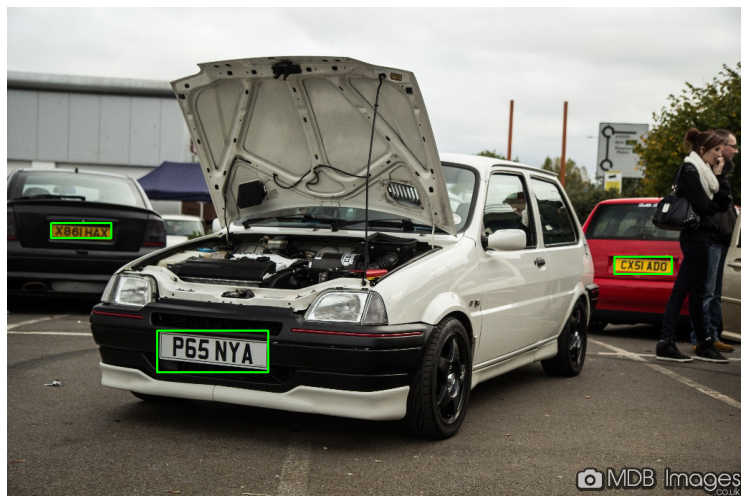

In [26]:
filename = np.random.choice(train_filenames)
visualize_from_dataset(filename, filename_to_bbox_train_dict)

In [27]:
val_filenames = list(filename_to_bbox_val_dict.keys())

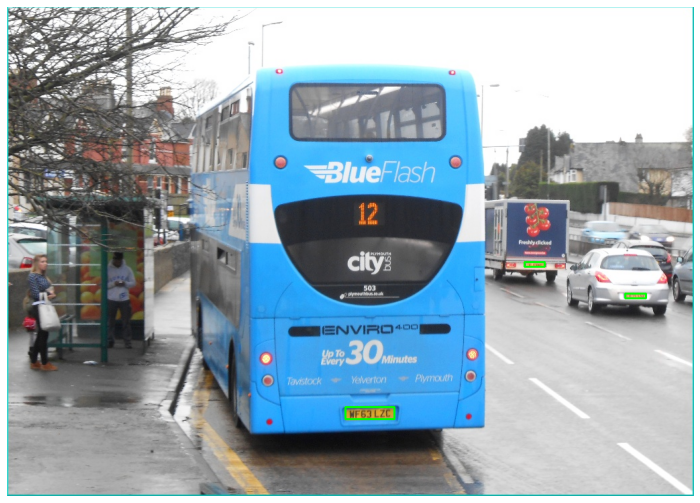

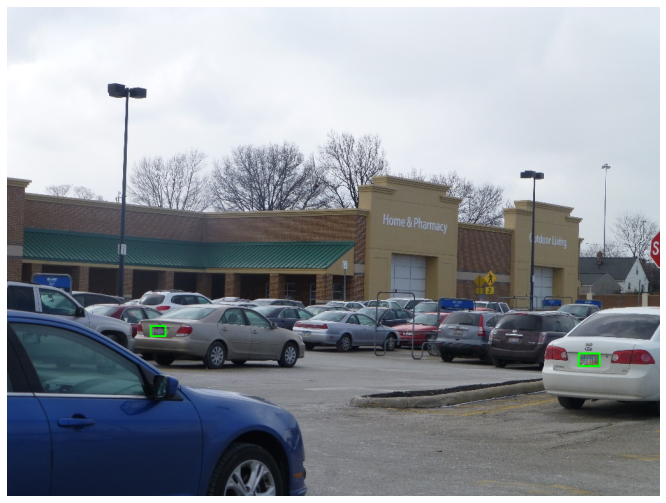

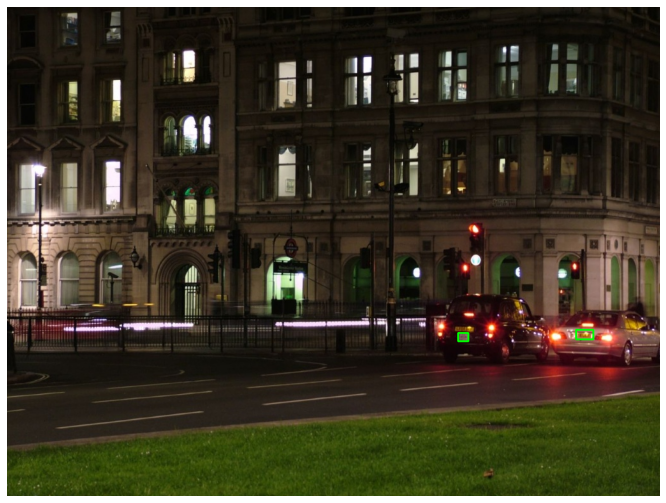

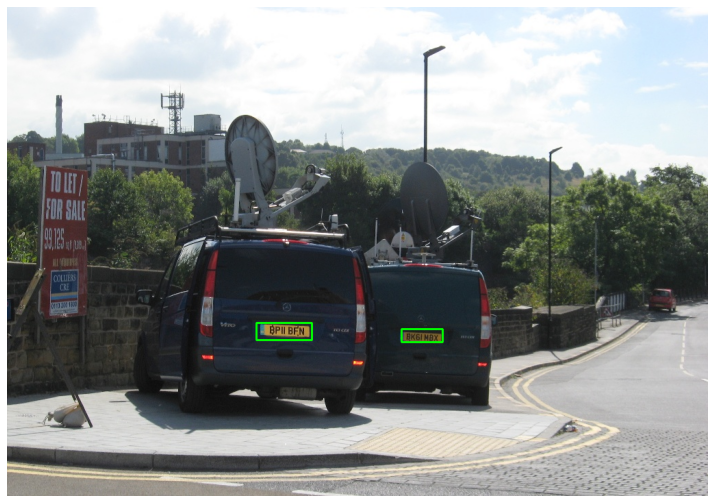

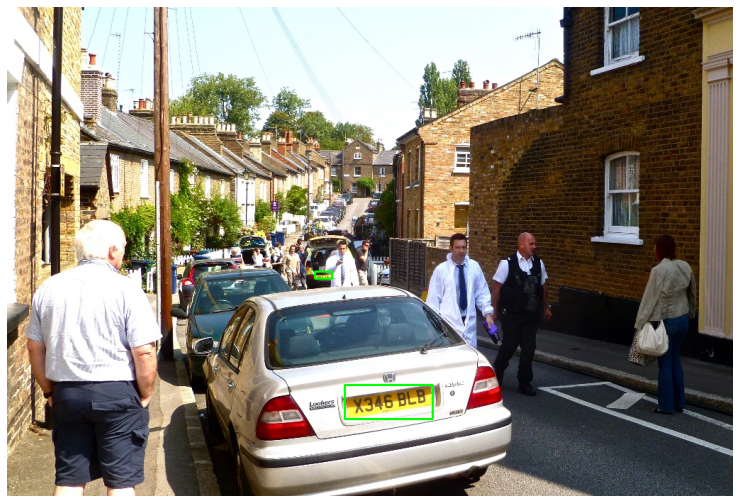

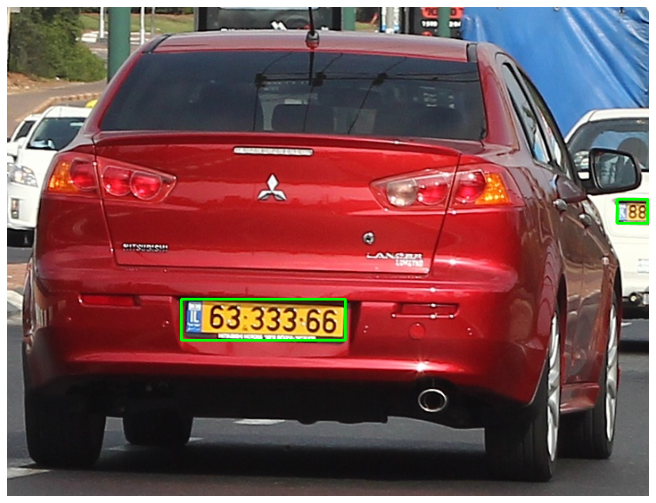

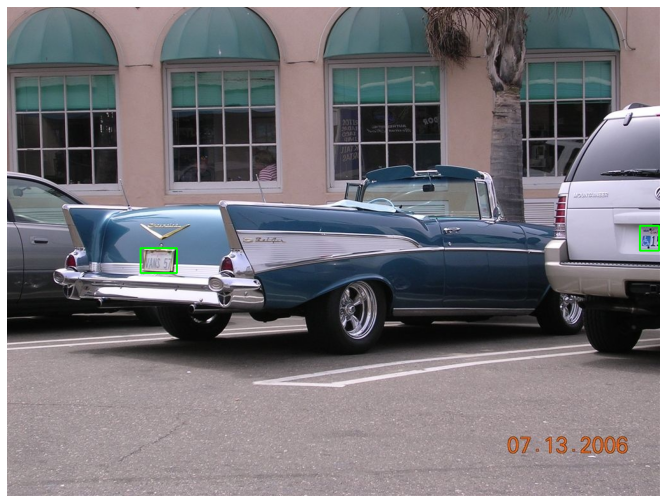

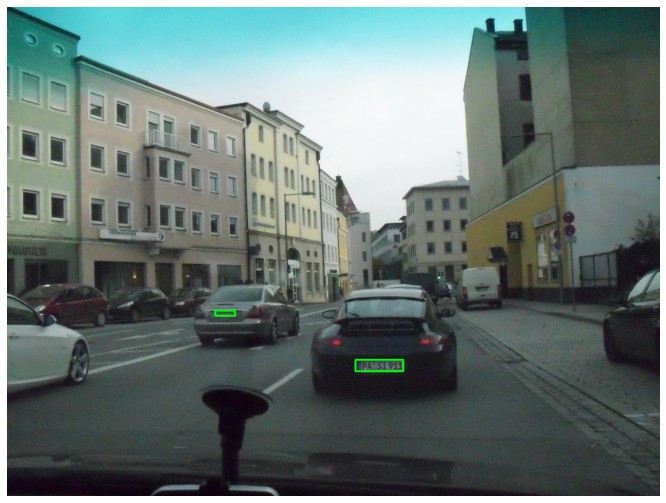

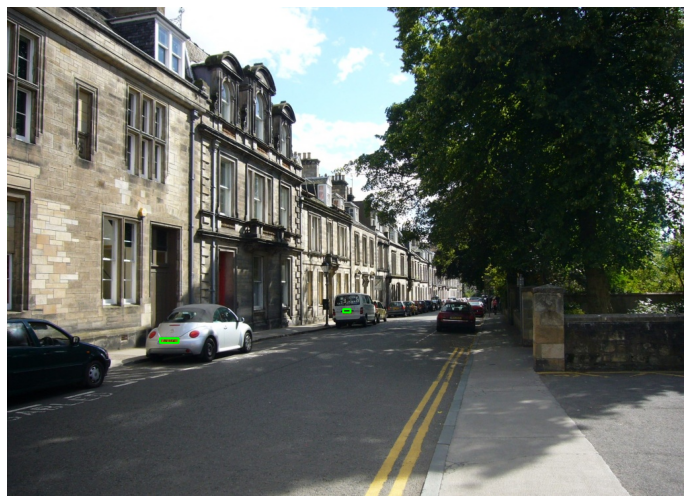

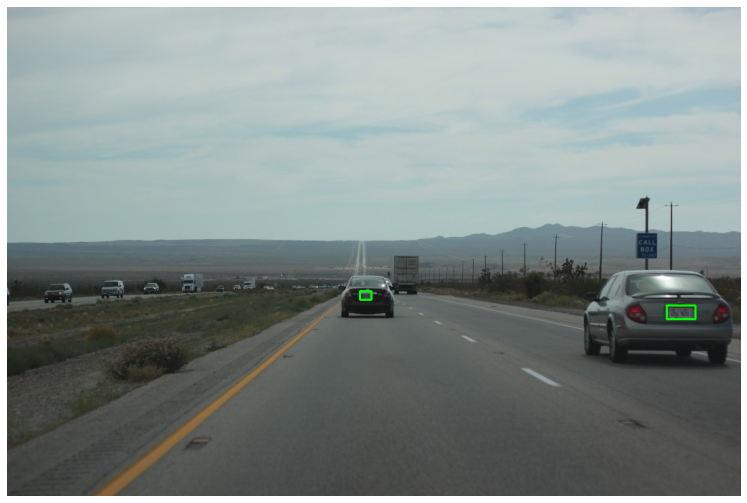

In [28]:
for filename in np.random.choice(val_filenames, 10):
    visualize_from_dataset(filename, filename_to_bbox_val_dict)

# Создадим класс датасета

In [29]:
import os
import numpy as np
import torch
import torch.utils.data
from PIL import Image
import json
from torchvision import transforms

class DetectionDataset(torch.utils.data.Dataset):
    def __init__(self, data_dict_file, transforms=None):
        self.transforms = transforms
        
        with open(data_dict_file, 'r') as f:
            self.data_dict = json.load(f)
        
        self.imgs = list(self.data_dict.keys())
        
    def __getitem__(self, idx):
        # load images ad masks
        img_path = self.imgs[idx]
        img = Image.open(img_path).convert("RGB")
        w, h = img.size

        num_objs = len(self.data_dict[img_path])
        boxes = []
        for i in range(num_objs):
            bbox = self.data_dict[img_path][i]
            xmin = bbox[0] * w
            xmax = bbox[1] * w
            ymin = bbox[2] * h
            ymax = bbox[3] * h
            boxes.append([xmin, ymin, xmax, ymax])

        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        # there is only one class
        labels = torch.ones((num_objs,), dtype=torch.int64)
        
        # is crowd
        iscrowd = torch.zeros((num_objs,), dtype=torch.int64)

        image_id = torch.tensor([idx])
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])

        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["image_id"] = image_id
        target["area"] = area
        target["iscrowd"] = iscrowd

        if self.transforms is not None:
            img = self.transforms(img)

        return img, target
    
    def __len__(self):
        return len(self.imgs)

# Create transforms

In [30]:
img_transforms = transforms.Compose([
    transforms.ToTensor()
])

# Load datasets

In [31]:
# collate_fn needs for batch
def collate_fn(batch):
    return tuple(zip(*batch))

In [32]:
# use our dataset and defined transformations
train_dataset = DetectionDataset('filename_to_bbox_train.json', img_transforms)
val_dataset = DetectionDataset('filename_to_bbox_val.json', img_transforms)

# Make dataloaders

In [33]:
# define training and validation data loaders
data_loader = torch.utils.data.DataLoader(
    train_dataset, batch_size=4, shuffle=True, num_workers=4,
    collate_fn=collate_fn, drop_last=True)

data_loader_val = torch.utils.data.DataLoader(
    val_dataset, batch_size=4, shuffle=False, num_workers=1,
    collate_fn=collate_fn, drop_last=False)

# Load model

In [34]:
model.roi_heads.box_predictor

FastRCNNPredictor(
  (cls_score): Linear(in_features=1024, out_features=91, bias=True)
  (bbox_pred): Linear(in_features=1024, out_features=364, bias=True)
)

In [35]:
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
# load a model pre-trained pre-trained on COCO
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True, pretrained_backbone=True)

## Собираем новую модель

In [36]:
num_classes = 2
in_channels = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_channels=in_channels, num_classes=num_classes)

In [37]:
assert model.roi_heads.box_predictor.cls_score.in_features == 1024
assert model.roi_heads.box_predictor.cls_score.out_features == 2
assert model.roi_heads.box_predictor.bbox_pred.out_features == 8

# Включить обучение только region-proposal сети и головы

In [38]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

# move model to the right device
model.to(device)

for param in model.parameters():
    param.requires_grad = False
for param in model.roi_heads.box_predictor.parameters():
    param.requires_grad = True
    
# construct an optimizer
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005,
                            momentum=0.9, weight_decay=0.0005)

In [39]:
len(params)

4

In [40]:
# and a learning rate scheduler which decreases the learning rate by
# 10x every 3 epochs
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,
                                               step_size=30,
                                               gamma=0.1)

# Обучение 

In [41]:
from engine import evaluate

In [42]:
import math
import sys
import time
import torch

from coco_utils import get_coco_api_from_dataset
from coco_eval import CocoEvaluator
import utils

def train_one_epoch(model, optimizer, data_loader, device, epoch, print_freq):
    model.train()
    metric_logger = utils.MetricLogger(delimiter="  ")
    metric_logger.add_meter('lr', utils.SmoothedValue(window_size=1, fmt='{value:.6f}'))
    header = 'Epoch: [{}]'.format(epoch)

    lr_scheduler = None
    if epoch == 0:
        warmup_factor = 1. / 1000
        warmup_iters = min(1000, len(data_loader) - 1)

        lr_scheduler = utils.warmup_lr_scheduler(optimizer, warmup_iters, warmup_factor)

    for images, targets in metric_logger.log_every(data_loader, print_freq, header):
        images = list(image.to(device) for image in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        # получим предсказания сети (словарь)        
        loss_dict = model(images, targets)
        # cложим их
        losses = sum(value for value in loss_dict.values())
        loss_value = losses.item()

        if not math.isfinite(loss_value):
            print("Loss is {}, stopping training".format(loss_value))
            print(loss_dict_reduced)
            sys.exit(1)

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()

        if lr_scheduler is not None:
            lr_scheduler.step()

        metric_logger.update(loss=losses, **loss_dict)
        metric_logger.update(lr=optimizer.param_groups[0]["lr"])

# Запустим обучение

In [43]:
num_epochs=10
for epoch in range(num_epochs):
    train_one_epoch(model, optimizer, data_loader, device, epoch, print_freq=50)
    # update the learning rate
    lr_scheduler.step()
    # evaluate on the test dataset
    evaluate(model, data_loader_val, device=device)
    torch.save(model.state_dict(), 'test_model_state_dict_last.pth')

Epoch: [0]  [  0/328]  eta: 0:04:46  lr: 0.000020  loss: 1.5961 (1.5961)  loss_classifier: 0.8841 (0.8841)  loss_box_reg: 0.0165 (0.0165)  loss_objectness: 0.6600 (0.6600)  loss_rpn_box_reg: 0.0354 (0.0354)  time: 0.8737  data: 0.5367  max mem: 2491
Epoch: [0]  [ 50/328]  eta: 0:01:13  lr: 0.000784  loss: 0.8236 (1.2326)  loss_classifier: 0.0418 (0.2298)  loss_box_reg: 0.0091 (0.0153)  loss_objectness: 0.6839 (0.8445)  loss_rpn_box_reg: 0.0866 (0.1430)  time: 0.2450  data: 0.0166  max mem: 2757
Epoch: [0]  [100/328]  eta: 0:00:58  lr: 0.001548  loss: 0.9515 (1.1260)  loss_classifier: 0.0342 (0.1396)  loss_box_reg: 0.0032 (0.0141)  loss_objectness: 0.7702 (0.8424)  loss_rpn_box_reg: 0.0959 (0.1299)  time: 0.2505  data: 0.0165  max mem: 2757
Epoch: [0]  [150/328]  eta: 0:00:45  lr: 0.002312  loss: 1.0265 (1.1213)  loss_classifier: 0.0261 (0.1051)  loss_box_reg: 0.0040 (0.0131)  loss_objectness: 0.7991 (0.8703)  loss_rpn_box_reg: 0.1002 (0.1327)  time: 0.2491  data: 0.0158  max mem: 2757


Epoch: [2]  [250/328]  eta: 0:00:19  lr: 0.005000  loss: 0.8418 (0.9790)  loss_classifier: 0.0064 (0.0097)  loss_box_reg: 0.0022 (0.0071)  loss_objectness: 0.6919 (0.8323)  loss_rpn_box_reg: 0.0779 (0.1299)  time: 0.2600  data: 0.0137  max mem: 3026
Epoch: [2]  [300/328]  eta: 0:00:07  lr: 0.005000  loss: 0.9141 (0.9930)  loss_classifier: 0.0035 (0.0094)  loss_box_reg: 0.0010 (0.0069)  loss_objectness: 0.7782 (0.8426)  loss_rpn_box_reg: 0.0823 (0.1342)  time: 0.2473  data: 0.0140  max mem: 3026
Epoch: [2]  [327/328]  eta: 0:00:00  lr: 0.005000  loss: 0.8384 (0.9915)  loss_classifier: 0.0073 (0.0098)  loss_box_reg: 0.0040 (0.0075)  loss_objectness: 0.7779 (0.8389)  loss_rpn_box_reg: 0.0832 (0.1353)  time: 0.2537  data: 0.0142  max mem: 3026
Epoch: [2] Total time: 0:01:23 (0.2540 s / it)
creating index...
index created!
Test:  [ 0/50]  eta: 0:00:24  model_time: 0.2020 (0.2020)  evaluator_time: 0.0052 (0.0052)  time: 0.4838  data: 0.2568  max mem: 3026
Test:  [49/50]  eta: 0:00:00  model_

Epoch: [5]  [  0/328]  eta: 0:03:56  lr: 0.005000  loss: 1.5669 (1.5669)  loss_classifier: 0.0047 (0.0047)  loss_box_reg: 0.0025 (0.0025)  loss_objectness: 1.1480 (1.1480)  loss_rpn_box_reg: 0.4118 (0.4118)  time: 0.7216  data: 0.4891  max mem: 3030
Epoch: [5]  [ 50/328]  eta: 0:01:13  lr: 0.005000  loss: 0.7625 (0.9586)  loss_classifier: 0.0048 (0.0117)  loss_box_reg: 0.0012 (0.0089)  loss_objectness: 0.6679 (0.8110)  loss_rpn_box_reg: 0.0407 (0.1270)  time: 0.2659  data: 0.0155  max mem: 3030
Epoch: [5]  [100/328]  eta: 0:00:59  lr: 0.005000  loss: 0.7249 (0.9493)  loss_classifier: 0.0053 (0.0098)  loss_box_reg: 0.0026 (0.0076)  loss_objectness: 0.6392 (0.7976)  loss_rpn_box_reg: 0.0974 (0.1343)  time: 0.2628  data: 0.0158  max mem: 3030
Epoch: [5]  [150/328]  eta: 0:00:46  lr: 0.005000  loss: 0.6577 (0.9632)  loss_classifier: 0.0046 (0.0091)  loss_box_reg: 0.0020 (0.0072)  loss_objectness: 0.5747 (0.8148)  loss_rpn_box_reg: 0.0980 (0.1320)  time: 0.2574  data: 0.0155  max mem: 3030


Epoch: [7]  [250/328]  eta: 0:00:19  lr: 0.005000  loss: 0.8244 (0.9583)  loss_classifier: 0.0032 (0.0071)  loss_box_reg: 0.0023 (0.0065)  loss_objectness: 0.7197 (0.8149)  loss_rpn_box_reg: 0.0762 (0.1298)  time: 0.2536  data: 0.0151  max mem: 3030
Epoch: [7]  [300/328]  eta: 0:00:07  lr: 0.005000  loss: 0.8456 (0.9803)  loss_classifier: 0.0040 (0.0078)  loss_box_reg: 0.0026 (0.0068)  loss_objectness: 0.7997 (0.8305)  loss_rpn_box_reg: 0.0947 (0.1351)  time: 0.2555  data: 0.0142  max mem: 3030
Epoch: [7]  [327/328]  eta: 0:00:00  lr: 0.005000  loss: 1.0424 (0.9882)  loss_classifier: 0.0048 (0.0077)  loss_box_reg: 0.0010 (0.0067)  loss_objectness: 0.8542 (0.8385)  loss_rpn_box_reg: 0.1118 (0.1353)  time: 0.2490  data: 0.0151  max mem: 3030
Epoch: [7] Total time: 0:01:23 (0.2549 s / it)
creating index...
index created!
Test:  [ 0/50]  eta: 0:00:24  model_time: 0.2108 (0.2108)  evaluator_time: 0.0041 (0.0041)  time: 0.4842  data: 0.2500  max mem: 3030
Test:  [49/50]  eta: 0:00:00  model_

## Сохраним модель

In [44]:
torch.save(model.state_dict(), 'test_model_state_dict_workshop_final.pth')

# Загрузим сохраненную модель

In [55]:
model.load_state_dict(torch.load('./model_state_dict_final.pth'))

<All keys matched successfully>

In [56]:
model.to(device)

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [57]:
evaluate(model, data_loader_val, device=device)

creating index...
index created!
Test:  [ 0/50]  eta: 0:00:25  model_time: 0.2097 (0.2097)  evaluator_time: 0.0049 (0.0049)  time: 0.5008  data: 0.2665  max mem: 3030
Test:  [49/50]  eta: 0:00:00  model_time: 0.2005 (0.2046)  evaluator_time: 0.0064 (0.0066)  time: 0.2513  data: 0.0147  max mem: 3030
Test: Total time: 0:00:12 (0.2527 s / it)
Averaged stats: model_time: 0.2005 (0.2046)  evaluator_time: 0.0064 (0.0066)
Accumulating evaluation results...
DONE (t=0.07s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.372
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.779
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.294
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.291
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.520
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.443
 Average Recall     (AR) @[ IoU=

# Визуализируем предсказания для валидации

In [58]:
def visualize_prediction_plate(file, model, device='cuda', verbose=True, thresh=0.0, 
                               n_colors=None, id_to_name=None):
    img = Image.open(file)
    img_tensor = val_transform(img)
    model.to(device)
    model.eval()
    with torch.no_grad():
        predictions = model(img_tensor.to(device)) # list of size 1
    prediction = predictions[0]
    
    if n_colors is None:
        n_colors = model.roi_heads.box_predictor.cls_score.out_features
    
    palette = sns.color_palette(None, n_colors)
    
    # visualize
    img = cv2.imread(file, cv2.COLOR_BGR2RGB)
    h, w = img.shape[:2]
    image = img
    for i in range(len(prediction['boxes'])):
        x_min, y_min, x_max, y_max = map(int, prediction['boxes'][i].tolist())
        label = int(prediction['labels'][i].cpu())
        score = float(prediction['scores'][i].cpu())
        name = id_to_name[label]
        color = palette[label]
        if verbose:
            if score > thresh:
                print ('Class: {}, Confidence: {}'.format(name, score))
        if score > thresh:
            image = cv2.rectangle(img, (x_min, y_min), (x_max, y_max), np.array(color) * 255, 2)
            cv2.putText(image, name, (x_min, y_min-10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, np.array(color) * 255, 2)
    show_image(image)
    return prediction

# Визуализируем предсказания

In [59]:
val_filenames = list(filename_to_bbox_val_dict.keys())

In [60]:
filename = np.random.choice(val_filenames)
print(filename)

./number_plates/00052.jpg


Class: plate, Confidence: 0.9945403933525085
Class: plate, Confidence: 0.7861568331718445


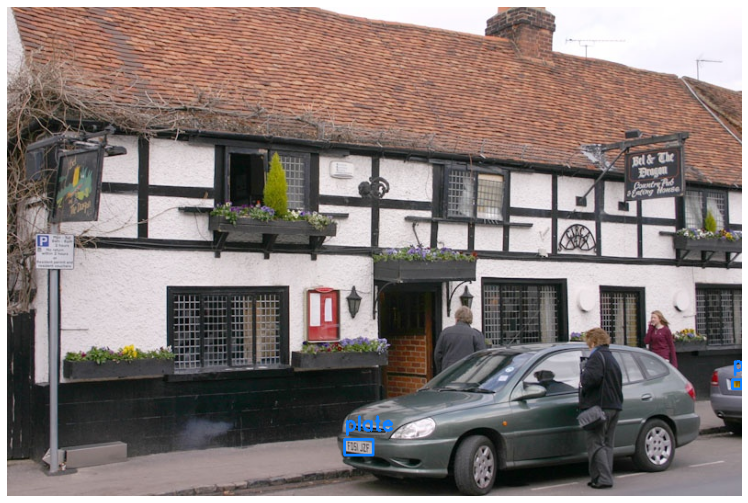

{'boxes': tensor([[367.3752, 471.9120, 398.0959, 488.1392],
         [789.0793, 406.6793, 799.9179, 416.5850],
         [368.0909, 471.2571, 384.7310, 485.3806]], device='cuda:0'),
 'labels': tensor([1, 1, 1], device='cuda:0'),
 'scores': tensor([0.9945, 0.7862, 0.2621], device='cuda:0')}

In [61]:
filename = np.random.choice(val_filenames)
visualize_prediction_plate(filename, model, id_to_name={1: 'plate'}, thresh=0.5)